In [1]:
from satpy import Scene, MultiScene
from satpy import find_files_and_readers
from satpy.writers import get_enhanced_image
from pyresample import create_area_def
from glob import glob
import matplotlib.pyplot as plt
import xarray as xr
import pandas as pd
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
import numpy as np
%matplotlib inline
import cmocean
import cmocean.cm as cmo
from dask.diagnostics import ProgressBar
from celluloid import Camera
from IPython.display import HTML

In [2]:
filenames = glob('/Users/Arman/Desktop/Nasa CDOM Files/AugFilesFull/MYD021KM.A2020*.hdf')
filenames.sort()
filenames

['/Users/Arman/Desktop/Nasa CDOM Files/AugFilesFull\\MYD021KM.A2020233.1750.061.2020301230434.hdf',
 '/Users/Arman/Desktop/Nasa CDOM Files/AugFilesFull\\MYD021KM.A2020233.1930.061.2020301230112.hdf',
 '/Users/Arman/Desktop/Nasa CDOM Files/AugFilesFull\\MYD021KM.A2020234.1830.061.2020301231758.hdf',
 '/Users/Arman/Desktop/Nasa CDOM Files/AugFilesFull\\MYD021KM.A2020234.1835.061.2020301231918.hdf',
 '/Users/Arman/Desktop/Nasa CDOM Files/AugFilesFull\\MYD021KM.A2020235.1740.061.2020301233059.hdf',
 '/Users/Arman/Desktop/Nasa CDOM Files/AugFilesFull\\MYD021KM.A2020235.1915.061.2020301233210.hdf',
 '/Users/Arman/Desktop/Nasa CDOM Files/AugFilesFull\\MYD021KM.A2020235.1920.061.2020301233218.hdf',
 '/Users/Arman/Desktop/Nasa CDOM Files/AugFilesFull\\MYD021KM.A2020236.1820.061.2020301234451.hdf',
 '/Users/Arman/Desktop/Nasa CDOM Files/AugFilesFull\\MYD021KM.A2020236.2000.061.2020301234457.hdf',
 '/Users/Arman/Desktop/Nasa CDOM Files/AugFilesFull\\MYD021KM.A2020237.1905.061.2020301235858.hdf',


In [3]:
swats = np.unique([f.split('.')[1] for f in filenames])
swats

array(['A2020233', 'A2020234', 'A2020235', 'A2020236', 'A2020237',
       'A2020238', 'A2020239', 'A2020240', 'A2020241', 'A2020242'],
      dtype='<U8')

# Basic Imaging

In [4]:
fileToUse = glob('/Users/Arman/Desktop/Nasa CDOM Files/test/MYD021KM.A2020298.1830.061.2020299151607.hdf')

scn = Scene(fileToUse, reader='modis_l1b')

['/Users/Arman/Desktop/Nasa CDOM Files/AugFilesFull\\MYD021KM.A2020234.1830.061.2020301231758.hdf', '/Users/Arman/Desktop/Nasa CDOM Files/AugFilesFull\\MYD021KM.A2020234.1835.061.2020301231918.hdf']


C:\Users\Arman\anaconda3\envs\satpy\lib\site-packages\pyproj\crs\crs.py:1256: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  return self._crs.to_proj4(version=version)
C:\Users\Arman\anaconda3\envs\satpy\lib\site-packages\satpy\modifiers\angles.py:485: RuntimeWarning: invalid value encountered in log
  grad_factor = 1. - np.log(grad_factor + 1) / np.log(2)
C:\Users\Arman\anaconda3\envs\satpy\lib\site-packages\dask\core.py:119: RuntimeWarning: invalid value encountered in arccos
  return func(*(_execute_task(a, cache) for a in args))
C:\Users\Arman\anaconda3\envs\satpy\lib\site-packages\dask\core.py:119: RuntimeWarning: invalid value encountered in remainder
  return func(*(_execute_task(a, cache) for a in args))
C:\Users\Arman\anaconda3\envs\satpy\lib\site-packages\satpy\modifiers\angles.py:485: RuntimeWarning: in

Text(0.5, 1.0, 'MODISA_2020-08-21T18:30:00')

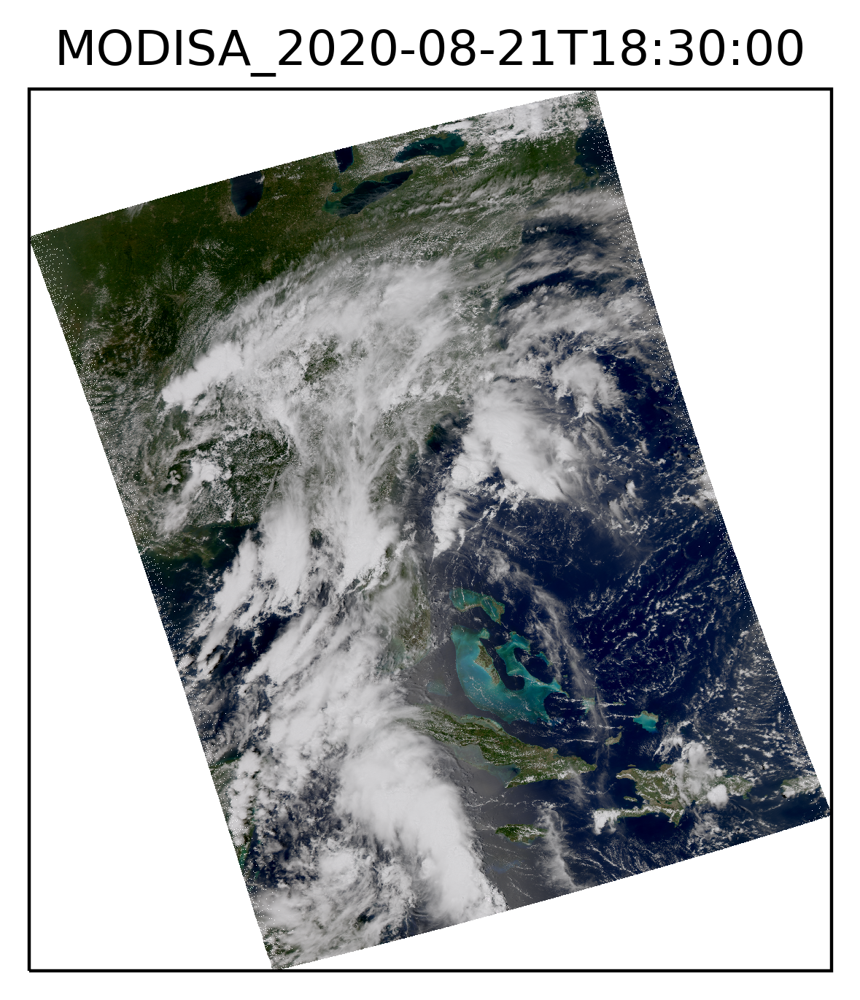

In [5]:
i=0
base = '/Users/Arman/Desktop/Nasa CDOM Files/AugFilesFull/MYD021KM.'

dayfiles = glob(base+swats[1]+'*')
print(dayfiles)
#create scene
scn = Scene(dayfiles, reader='modis_l1b')
scn.load(['10','4'])
scn.load(['true_color'])
#reproject
area_proj = {'proj': 'lcc', 'lon_0': -91., 'lat_0': 29.5, 'lat_1': 29.5, 'lat_2': 29.5}
my_area = scn['10'].attrs['area'].compute_optimal_bb_area(area_proj)
new_scn = scn.resample(my_area)
#generate RGB from true color
rgb = get_enhanced_image(new_scn['true_color'])
#extract projection
crs = new_scn['true_color'].attrs['area'].to_cartopy_crs()
#make plot
fig =  plt.figure(figsize=(6, 4), dpi=400)
ax1 = plt.subplot(projection=crs)
rgb.data.plot.imshow(rgb='bands', transform=crs, ax=ax1)
ax1.set_title('MODISA_%s' % new_scn.start_time.isoformat())
#save figure
#fig.savefig('MODISA_%s_rgb.png' % new_scn.start_time.isoformat())

# Animations

## Display TXLA area

In [34]:
import warnings
warnings.filterwarnings('ignore')
ax1.annotate(new_scn.start_time.isoformat("|"), (75000,90000), color='black', fontsize=5) #Top Right

['/Users/Arman/Desktop/Nasa CDOM Files/AugFilesFull\\MYD021KM.A2020233.1750.061.2020301230434.hdf', '/Users/Arman/Desktop/Nasa CDOM Files/AugFilesFull\\MYD021KM.A2020233.1930.061.2020301230112.hdf']


C:\Users\Arman\anaconda3\envs\satpy\lib\site-packages\dask\core.py:119: RuntimeWarning: invalid value encountered in log
  return func(*(_execute_task(a, cache) for a in args))
C:\Users\Arman\anaconda3\envs\satpy\lib\site-packages\satpy\modifiers\angles.py:485: RuntimeWarning: invalid value encountered in log
  grad_factor = 1. - np.log(grad_factor + 1) / np.log(2)
C:\Users\Arman\anaconda3\envs\satpy\lib\site-packages\dask\core.py:119: RuntimeWarning: invalid value encountered in arccos
  return func(*(_execute_task(a, cache) for a in args))
C:\Users\Arman\anaconda3\envs\satpy\lib\site-packages\satpy\modifiers\angles.py:485: RuntimeWarning: invalid value encountered in log
  grad_factor = 1. - np.log(grad_factor + 1) / np.log(2)
C:\Users\Arman\anaconda3\envs\satpy\lib\site-packages\dask\core.py:119: RuntimeWarning: invalid value encountered in arccos
  return func(*(_execute_task(a, cache) for a in args))
Clipping input data to the valid range for imshow with RGB data ([0..1] for float

['/Users/Arman/Desktop/Nasa CDOM Files/AugFilesFull\\MYD021KM.A2020234.1830.061.2020301231758.hdf', '/Users/Arman/Desktop/Nasa CDOM Files/AugFilesFull\\MYD021KM.A2020234.1835.061.2020301231918.hdf']


C:\Users\Arman\anaconda3\envs\satpy\lib\site-packages\dask\core.py:119: RuntimeWarning: invalid value encountered in log
  return func(*(_execute_task(a, cache) for a in args))
C:\Users\Arman\anaconda3\envs\satpy\lib\site-packages\satpy\modifiers\angles.py:485: RuntimeWarning: invalid value encountered in log
  grad_factor = 1. - np.log(grad_factor + 1) / np.log(2)
C:\Users\Arman\anaconda3\envs\satpy\lib\site-packages\dask\core.py:119: RuntimeWarning: invalid value encountered in remainder
  return func(*(_execute_task(a, cache) for a in args))
C:\Users\Arman\anaconda3\envs\satpy\lib\site-packages\dask\core.py:119: RuntimeWarning: invalid value encountered in arccos
  return func(*(_execute_task(a, cache) for a in args))
C:\Users\Arman\anaconda3\envs\satpy\lib\site-packages\dask\core.py:119: RuntimeWarning: invalid value encountered in arccos
  return func(*(_execute_task(a, cache) for a in args))
C:\Users\Arman\anaconda3\envs\satpy\lib\site-packages\satpy\modifiers\angles.py:485: Runt

['/Users/Arman/Desktop/Nasa CDOM Files/AugFilesFull\\MYD021KM.A2020235.1740.061.2020301233059.hdf', '/Users/Arman/Desktop/Nasa CDOM Files/AugFilesFull\\MYD021KM.A2020235.1915.061.2020301233210.hdf', '/Users/Arman/Desktop/Nasa CDOM Files/AugFilesFull\\MYD021KM.A2020235.1920.061.2020301233218.hdf']


C:\Users\Arman\anaconda3\envs\satpy\lib\site-packages\dask\core.py:119: RuntimeWarning: invalid value encountered in log
  return func(*(_execute_task(a, cache) for a in args))
C:\Users\Arman\anaconda3\envs\satpy\lib\site-packages\satpy\modifiers\angles.py:485: RuntimeWarning: invalid value encountered in log
  grad_factor = 1. - np.log(grad_factor + 1) / np.log(2)
C:\Users\Arman\anaconda3\envs\satpy\lib\site-packages\dask\core.py:119: RuntimeWarning: invalid value encountered in arccos
  return func(*(_execute_task(a, cache) for a in args))
C:\Users\Arman\anaconda3\envs\satpy\lib\site-packages\satpy\modifiers\angles.py:485: RuntimeWarning: invalid value encountered in log
  grad_factor = 1. - np.log(grad_factor + 1) / np.log(2)
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


['/Users/Arman/Desktop/Nasa CDOM Files/AugFilesFull\\MYD021KM.A2020236.1820.061.2020301234451.hdf', '/Users/Arman/Desktop/Nasa CDOM Files/AugFilesFull\\MYD021KM.A2020236.2000.061.2020301234457.hdf']


C:\Users\Arman\anaconda3\envs\satpy\lib\site-packages\dask\core.py:119: RuntimeWarning: invalid value encountered in log
  return func(*(_execute_task(a, cache) for a in args))
C:\Users\Arman\anaconda3\envs\satpy\lib\site-packages\satpy\modifiers\angles.py:485: RuntimeWarning: invalid value encountered in log
  grad_factor = 1. - np.log(grad_factor + 1) / np.log(2)
C:\Users\Arman\anaconda3\envs\satpy\lib\site-packages\dask\core.py:119: RuntimeWarning: invalid value encountered in arccos
  return func(*(_execute_task(a, cache) for a in args))
C:\Users\Arman\anaconda3\envs\satpy\lib\site-packages\dask\core.py:119: RuntimeWarning: invalid value encountered in remainder
  return func(*(_execute_task(a, cache) for a in args))
C:\Users\Arman\anaconda3\envs\satpy\lib\site-packages\satpy\modifiers\angles.py:485: RuntimeWarning: invalid value encountered in log
  grad_factor = 1. - np.log(grad_factor + 1) / np.log(2)
Clipping input data to the valid range for imshow with RGB data ([0..1] for fl

['/Users/Arman/Desktop/Nasa CDOM Files/AugFilesFull\\MYD021KM.A2020237.1905.061.2020301235858.hdf']


C:\Users\Arman\anaconda3\envs\satpy\lib\site-packages\dask\core.py:119: RuntimeWarning: invalid value encountered in log
  return func(*(_execute_task(a, cache) for a in args))
C:\Users\Arman\anaconda3\envs\satpy\lib\site-packages\satpy\modifiers\angles.py:485: RuntimeWarning: invalid value encountered in log
  grad_factor = 1. - np.log(grad_factor + 1) / np.log(2)
C:\Users\Arman\anaconda3\envs\satpy\lib\site-packages\dask\core.py:119: RuntimeWarning: invalid value encountered in arccos
  return func(*(_execute_task(a, cache) for a in args))
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


['/Users/Arman/Desktop/Nasa CDOM Files/AugFilesFull\\MYD021KM.A2020238.1810.061.2020302001419.hdf', '/Users/Arman/Desktop/Nasa CDOM Files/AugFilesFull\\MYD021KM.A2020238.1950.061.2020302001406.hdf']


C:\Users\Arman\anaconda3\envs\satpy\lib\site-packages\dask\core.py:119: RuntimeWarning: invalid value encountered in log
  return func(*(_execute_task(a, cache) for a in args))
C:\Users\Arman\anaconda3\envs\satpy\lib\site-packages\satpy\modifiers\angles.py:485: RuntimeWarning: invalid value encountered in log
  grad_factor = 1. - np.log(grad_factor + 1) / np.log(2)
C:\Users\Arman\anaconda3\envs\satpy\lib\site-packages\dask\core.py:119: RuntimeWarning: invalid value encountered in arccos
  return func(*(_execute_task(a, cache) for a in args))
C:\Users\Arman\anaconda3\envs\satpy\lib\site-packages\satpy\modifiers\angles.py:485: RuntimeWarning: invalid value encountered in log
  grad_factor = 1. - np.log(grad_factor + 1) / np.log(2)
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


['/Users/Arman/Desktop/Nasa CDOM Files/AugFilesFull\\MYD021KM.A2020239.1850.061.2020302002705.hdf', '/Users/Arman/Desktop/Nasa CDOM Files/AugFilesFull\\MYD021KM.A2020239.1855.061.2020302002821.hdf', '/Users/Arman/Desktop/Nasa CDOM Files/AugFilesFull\\MYD021KM.A2020239.2030.061.2020302002617.hdf']


C:\Users\Arman\anaconda3\envs\satpy\lib\site-packages\dask\core.py:119: RuntimeWarning: invalid value encountered in log
  return func(*(_execute_task(a, cache) for a in args))
C:\Users\Arman\anaconda3\envs\satpy\lib\site-packages\dask\core.py:119: RuntimeWarning: invalid value encountered in remainder
  return func(*(_execute_task(a, cache) for a in args))
C:\Users\Arman\anaconda3\envs\satpy\lib\site-packages\satpy\modifiers\angles.py:485: RuntimeWarning: invalid value encountered in log
  grad_factor = 1. - np.log(grad_factor + 1) / np.log(2)
C:\Users\Arman\anaconda3\envs\satpy\lib\site-packages\dask\core.py:119: RuntimeWarning: invalid value encountered in arccos
  return func(*(_execute_task(a, cache) for a in args))


['/Users/Arman/Desktop/Nasa CDOM Files/AugFilesFull\\MYD021KM.A2020240.1755.061.2020302003819.hdf', '/Users/Arman/Desktop/Nasa CDOM Files/AugFilesFull\\MYD021KM.A2020240.1800.061.2020302003900.hdf', '/Users/Arman/Desktop/Nasa CDOM Files/AugFilesFull\\MYD021KM.A2020240.1935.061.2020302003806.hdf']


C:\Users\Arman\anaconda3\envs\satpy\lib\site-packages\dask\core.py:119: RuntimeWarning: invalid value encountered in log
  return func(*(_execute_task(a, cache) for a in args))
C:\Users\Arman\anaconda3\envs\satpy\lib\site-packages\dask\core.py:119: RuntimeWarning: invalid value encountered in arccos
  return func(*(_execute_task(a, cache) for a in args))
C:\Users\Arman\anaconda3\envs\satpy\lib\site-packages\satpy\modifiers\angles.py:485: RuntimeWarning: invalid value encountered in log
  grad_factor = 1. - np.log(grad_factor + 1) / np.log(2)
C:\Users\Arman\anaconda3\envs\satpy\lib\site-packages\dask\core.py:119: RuntimeWarning: invalid value encountered in remainder
  return func(*(_execute_task(a, cache) for a in args))
C:\Users\Arman\anaconda3\envs\satpy\lib\site-packages\satpy\modifiers\angles.py:485: RuntimeWarning: invalid value encountered in log
  grad_factor = 1. - np.log(grad_factor + 1) / np.log(2)
C:\Users\Arman\anaconda3\envs\satpy\lib\site-packages\dask\core.py:119: Runtim

['/Users/Arman/Desktop/Nasa CDOM Files/AugFilesFull\\MYD021KM.A2020241.1840.061.2020302005034.hdf', '/Users/Arman/Desktop/Nasa CDOM Files/AugFilesFull\\MYD021KM.A2020241.2020.061.2020302005029.hdf']


C:\Users\Arman\anaconda3\envs\satpy\lib\site-packages\dask\core.py:119: RuntimeWarning: invalid value encountered in log
  return func(*(_execute_task(a, cache) for a in args))
C:\Users\Arman\anaconda3\envs\satpy\lib\site-packages\satpy\modifiers\angles.py:485: RuntimeWarning: invalid value encountered in log
  grad_factor = 1. - np.log(grad_factor + 1) / np.log(2)
C:\Users\Arman\anaconda3\envs\satpy\lib\site-packages\dask\core.py:119: RuntimeWarning: invalid value encountered in arccos
  return func(*(_execute_task(a, cache) for a in args))
C:\Users\Arman\anaconda3\envs\satpy\lib\site-packages\satpy\modifiers\angles.py:485: RuntimeWarning: invalid value encountered in log
  grad_factor = 1. - np.log(grad_factor + 1) / np.log(2)
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


['/Users/Arman/Desktop/Nasa CDOM Files/AugFilesFull\\MYD021KM.A2020242.1745.061.2020302010151.hdf', '/Users/Arman/Desktop/Nasa CDOM Files/AugFilesFull\\MYD021KM.A2020242.1925.061.2020302010227.hdf']


C:\Users\Arman\anaconda3\envs\satpy\lib\site-packages\dask\core.py:119: RuntimeWarning: invalid value encountered in log
  return func(*(_execute_task(a, cache) for a in args))
C:\Users\Arman\anaconda3\envs\satpy\lib\site-packages\dask\core.py:119: RuntimeWarning: invalid value encountered in arccos
  return func(*(_execute_task(a, cache) for a in args))
C:\Users\Arman\anaconda3\envs\satpy\lib\site-packages\satpy\modifiers\angles.py:485: RuntimeWarning: invalid value encountered in log
  grad_factor = 1. - np.log(grad_factor + 1) / np.log(2)
C:\Users\Arman\anaconda3\envs\satpy\lib\site-packages\satpy\modifiers\angles.py:485: RuntimeWarning: invalid value encountered in log
  grad_factor = 1. - np.log(grad_factor + 1) / np.log(2)
C:\Users\Arman\anaconda3\envs\satpy\lib\site-packages\dask\core.py:119: RuntimeWarning: invalid value encountered in arccos
  return func(*(_execute_task(a, cache) for a in args))
Clipping input data to the valid range for imshow with RGB data ([0..1] for float

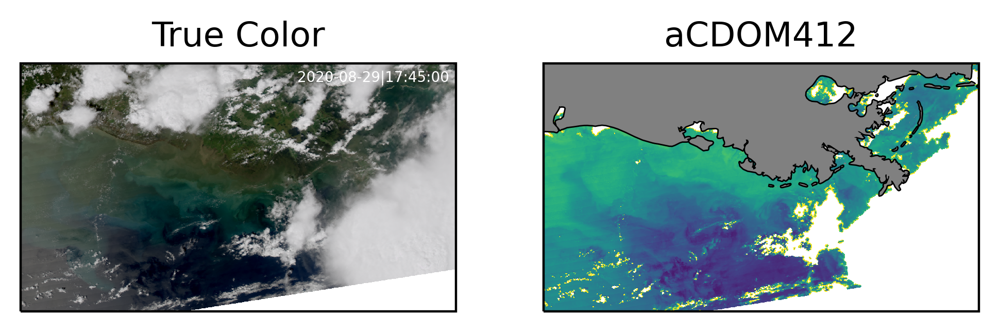

In [23]:
res = '10m'
extent=[-94, 27.5, -88, 30.5]
base = '/Users/Arman/Desktop/Nasa CDOM Files/AugFilesFull/MYD021KM.'

#Define Camera & Figure
fig =  plt.figure(figsize=(6, 2), dpi=400)
camera = Camera(fig)

#constants
A = 0.472; B = 1.48; C = 4.64

my_area = create_area_def('my_area', {'proj': 'lcc', 'lon_0': -91., 'lat_0': 29.5, 'lat_1': 29.5, 'lat_2': 29.5},
                          width=1500, height=750,
                          area_extent=extent, units='degrees')
    
for swat in swats:
    dayfiles = glob(base+swat+'*')
    print(dayfiles)
    scn = Scene(dayfiles, reader='modis_l1b')
    scn.load(['10','4'])
    scn.load(['true_color'])

    #reproject
    new_scn = scn.resample(my_area)

    #generate RGB from true color
    rgb = get_enhanced_image(new_scn['true_color'])

    #calculate aCDOM
    aCDOM412 = (np.log((new_scn['10']/new_scn['4'] - A)/ B))/(-C)
    aCDOM412 = aCDOM412.compute()

    #extract projection and lon lat from products
    crs = new_scn['true_color'].attrs['area'].to_cartopy_crs()
    lons, lats = new_scn['true_color'].attrs['area'].get_lonlats()

    #left true color
    ax1 = plt.subplot(1, 2, 1, projection=crs)
    rgb.data.plot.imshow(rgb='bands', transform=crs, ax=ax1)
    ax1.set_title('True Color')
    ax1.annotate(new_scn.start_time.isoformat("|"), (75000,90000), color='white', fontsize=5) #Top Right
    
    #right aCDOM
    trim = aCDOM412.max().values
    ax2 = plt.subplot(1, 2, 2, projection=crs)
    #costline with specified resolution
    ax2.coastlines(res)
    #this is ploting x,y, aCDOM
    ax2.pcolormesh(lons, lats, aCDOM412.where(aCDOM412<=trim), transform=ccrs.PlateCarree(),
                  vmin=.01, vmax=.3)
    #mask the land
    ax2.add_feature(cfeature.NaturalEarthFeature(category='physical', 
                                                name='land', facecolor='grey',
                                                scale=res))
    ax2.set_title('aCDOM412')
    
    #Add frame
    camera.snap()

#Create animation & Display embedded animation
animation = camera.animate(interval = 1000)
HTML(animation.to_jshtml())

In [32]:
#Save Animation
animation.save('MODIS_Animation_Aug2029.mp4')